In [6]:
pip install umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.0/31.0 MB 123.7 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [4]:
import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv('games.csv')

df.head(30)

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1.504210e+12,1.504210e+12,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5
1,l1NXvwaE,True,1.504130e+12,1.504130e+12,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4
2,mIICvQHh,True,1.504130e+12,1.504130e+12,61,mate,white,5+10,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3
3,kWKvrqYL,True,1.504110e+12,1.504110e+12,61,mate,white,20+0,daniamurashov,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3
4,9tXo1AUZ,True,1.504030e+12,1.504030e+12,95,mate,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5
5,MsoDV9wj,False,1.504240e+12,1.504240e+12,5,draw,draw,10+0,trelynn17,1250,franklin14532,1002,e4 c5 Nf3 Qa5 a3,B27,Sicilian Defense: Mongoose Variation,4
6,qwU9rasv,True,1.504230e+12,1.504230e+12,33,resign,white,10+0,capa_jr,1520,daniel_likes_chess,1423,d4 d5 e4 dxe4 Nc3 Nf6 f3 exf3 Nxf3 Nc6 Bb5 a6 ...,D00,Blackmar-Diemer Gambit: Pietrowsky Defense,10
7,RVN0N3VK,False,1.503680e+12,1.503680e+12,9,resign,black,15+30,daniel_likes_chess,1413,soultego,2108,e4 Nc6 d4 e5 d5 Nce7 c3 Ng6 b4,B00,Nimzowitsch Defense: Kennedy Variation | Link...,5
8,dwF3DJHO,True,1.503510e+12,1.503510e+12,66,resign,black,15+0,ehabfanri,1439,daniel_likes_chess,1392,e4 e5 Bc4 Nc6 Nf3 Nd4 d3 Nxf3+ Qxf3 Nf6 h3 Bc5...,C50,Italian Game: Schilling-Kostic Gambit,6
9,afoMwnLg,True,1.503440e+12,1.503440e+12,119,mate,white,10+0,daniel_likes_chess,1381,mirco25,1209,e4 d5 exd5 Qxd5 Nc3 Qe5+ Be2 Na6 d4 Qf5 Bxa6 b...,B01,Scandinavian Defense: Mieses-Kotroc Variation,4


/var/folders/5b/wh90fyk55yl2hy5fzrkd8z3w0000gn/T/ipykernel_92040/1888014300.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=outcome_counts.index, y=outcome_counts.values, palette="viridis")


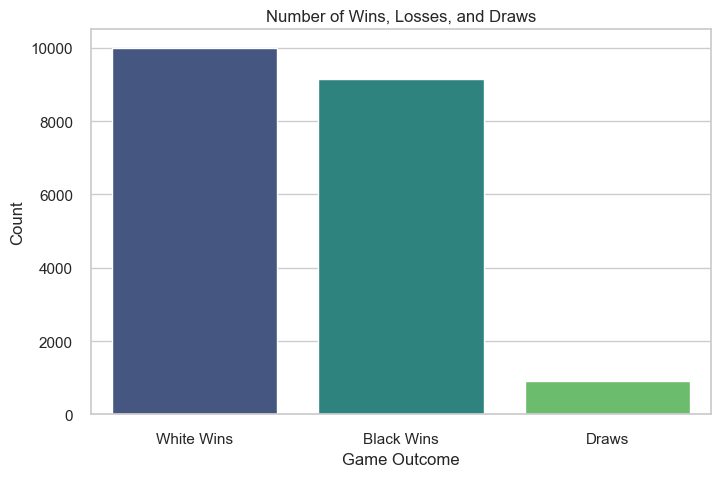

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv('games.csv')

# Create a new column to classify outcomes as wins (white/black), losses, and draws
df['outcome'] = df.apply(lambda row: 'draw' if row['victory_status'] == 'draw' 
                         else ('white_win' if row['winner'] == 'white' else 'black_win'), axis=1)

# Count occurrences of each outcome
outcome_counts = df['outcome'].value_counts()

# Set the seaborn style for better aesthetics
sns.set(style="whitegrid")

# Create a bar plot
plt.figure(figsize=(8, 5))
sns.barplot(x=outcome_counts.index, y=outcome_counts.values, palette="viridis")

# Customize the plot
plt.title("Number of Wins, Losses, and Draws")
plt.xlabel("Game Outcome")
plt.ylabel("Count")
plt.xticks(ticks=[0, 1, 2], labels=["White Wins", "Black Wins", "Draws"])
plt.show()


/var/folders/5b/wh90fyk55yl2hy5fzrkd8z3w0000gn/T/ipykernel_92040/1485158231.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=top_openings.index, x=top_openings.values, palette="magma")


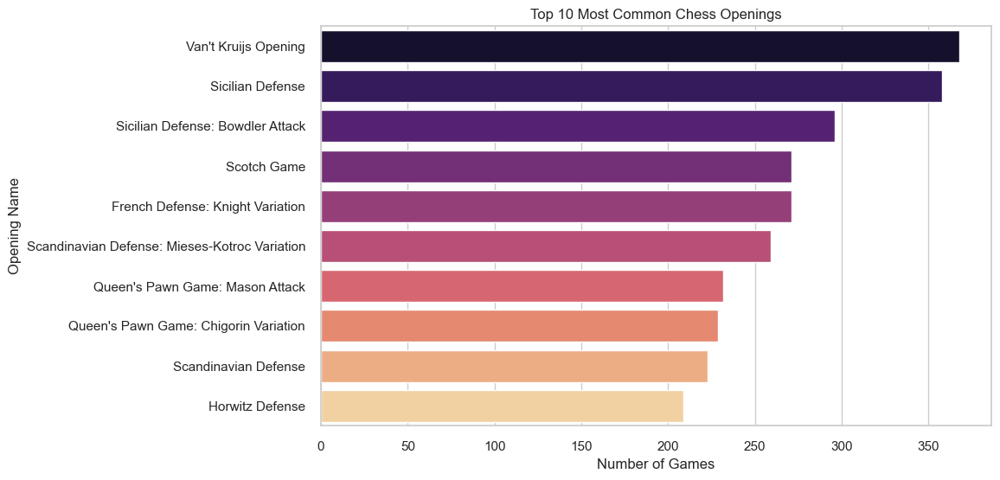

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv('games.csv')

# Count the occurrences of each opening and select the top 10
top_openings = df['opening_name'].value_counts().head(10)

# Set the seaborn style for better aesthetics
sns.set(style="whitegrid")

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(y=top_openings.index, x=top_openings.values, palette="magma")

# Customize the plot
plt.title("Top 10 Most Common Chess Openings")
plt.xlabel("Number of Games")
plt.ylabel("Opening Name")
plt.show()


In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('games.csv')

# Count occurrences of each opening and select the top 30
top_30_openings = df['opening_name'].value_counts().head(100)

# Convert the result to a DataFrame for easy viewing
top_30_openings_list = top_30_openings.reset_index().rename(columns={'index': 'Opening Name', 'opening_name': 'Count'})

# Display the list
print(top_30_openings_list)


                                            Count  count
0                            Van't Kruijs Opening    368
1                                Sicilian Defense    358
2                Sicilian Defense: Bowdler Attack    296
3                                     Scotch Game    271
4                French Defense: Knight Variation    271
5   Scandinavian Defense: Mieses-Kotroc Variation    259
6                 Queen's Pawn Game: Mason Attack    232
7           Queen's Pawn Game: Chigorin Variation    229
8                            Scandinavian Defense    223
9                                 Horwitz Defense    209
10                              Caro-Kann Defense    199
11                            Philidor Defense #3    198
12                            Philidor Defense #2    193
13                                    Indian Game    181
14         Italian Game: Anti-Fried Liver Defense    180
15           Four Knights Game: Italian Variation    176
16                             

In [10]:
import pandas as pd

# Load the dataset
df = pd.read_csv('games.csv')

# Define a function to categorize each opening by its main type
def categorize_opening(opening_name):
    if "Sicilian Defense" in opening_name:
        return "Sicilian Defense"
    elif "French Defense" in opening_name:
        return "French Defense"
    elif "Queen's Pawn Game" in opening_name:
        return "Queen's Pawn Game"
    elif "Scandinavian Defense" in opening_name:
        return "Scandinavian Defense"
    elif "Philidor Defense" in opening_name:
        return "Philidor Defense"
    elif "King's Pawn Game" in opening_name:
        return "King's Pawn Game"
    elif "Italian Game" in opening_name:
        return "Italian Game"
    elif "Ruy Lopez" in opening_name:
        return "Ruy Lopez"
    elif "Four Knights Game" in opening_name:
        return "Four Knights Game"
    # Add more categories as needed
    else:
        return opening_name.split(":")[0]  # Default to the first part if no specific match

# Apply the function to create a new column for main opening categories
df['main_opening'] = df['opening_name'].apply(categorize_opening)

# Count occurrences of each main opening and select the top 30
top_main_openings = df['main_opening'].value_counts().head(30)

# Convert to DataFrame for easy viewing
top_main_openings_list = top_main_openings.reset_index().rename(columns={'index': 'Main Opening', 'main_opening': 'Count'})

# Display the result
print(top_main_openings_list)

                      Count  count
0          Sicilian Defense   2650
1            French Defense   1412
2         Queen's Pawn Game   1215
3              Italian Game    981
4          King's Pawn Game    917
5                 Ruy Lopez    858
6      Scandinavian Defense    774
7          Philidor Defense    691
8           English Opening    662
9         Caro-Kann Defense    593
10              Scotch Game    465
11  Queen's Gambit Declined    394
12        Four Knights Game    370
13     Van't Kruijs Opening    368
14        Zukertort Opening    336
15         Bishop's Opening    323
16              Indian Game    319
17  Queen's Gambit Accepted    253
18             Russian Game    252
19   Queen's Gambit Refused    251
20           Modern Defense    225
21          Horwitz Defense    209
22      Nimzowitsch Defense    200
23    King's Indian Defense    197
24         Alekhine Defense    188
25             Slav Defense    187
26    King's Knight Opening    183
27        Hungarian 

In [11]:
import pandas as pd

# Load the dataset
df = pd.read_csv('games.csv')

# Define a function to categorize each opening by its main type
def categorize_opening(opening_name):
    if "Sicilian Defense" in opening_name:
        return "Sicilian Defense"
    elif "French Defense" in opening_name:
        return "French Defense"
    elif "Queen's Gambit Accepted" in opening_name:
        return "Queen's Gambit Accepted"
    elif "Queen's Gambit Refused" in opening_name:
        return "Queen's Gambit Refused"
    elif "Queen's Gambit Declined" in opening_name:
        return "Queen's Gambit Declined"
    elif "English Opening" in opening_name:
        return "English Opening"
    else:
        return opening_name.split(":")[0]

# Apply categorization
df['main_opening'] = df['opening_name'].apply(categorize_opening)

# Filter for the openings of interest
openings_of_interest = ["English Opening", "Sicilian Defense", "Queen's Gambit Accepted", 
                        "Queen's Gambit Refused", "Queen's Gambit Declined"]

# Calculate win/loss/draw counts for each opening
results = []
for opening in openings_of_interest:
    subset = df[df['main_opening'] == opening]
    win_counts = subset['winner'].value_counts()  # Counts of white/black/draw

    # Calculate win rates
    white_wins = win_counts.get('white', 0)
    black_wins = win_counts.get('black', 0)
    draws = win_counts.get('draw', 0)
    total_games = white_wins + black_wins + draws

    results.append({
        'Opening': opening,
        'White Wins': white_wins,
        'Black Wins': black_wins,
        'Draws': draws,
        'Total Games': total_games,
        'White Win Rate': (white_wins / total_games) * 100 if total_games > 0 else 0,
        'Black Win Rate': (black_wins / total_games) * 100 if total_games > 0 else 0,
        'Draw Rate': (draws / total_games) * 100 if total_games > 0 else 0
    })

# Convert results to DataFrame for display
results_df = pd.DataFrame(results)
print(results_df)


                   Opening  White Wins  Black Wins  Draws  Total Games  \
0          English Opening         395         296     29          720   
1         Sicilian Defense        1213        1306    131         2650   
2  Queen's Gambit Accepted         139         105      9          253   
3   Queen's Gambit Refused         152          91      8          251   
4  Queen's Gambit Declined         211         165     18          394   

   White Win Rate  Black Win Rate  Draw Rate  
0       54.861111       41.111111   4.027778  
1       45.773585       49.283019   4.943396  
2       54.940711       41.501976   3.557312  
3       60.557769       36.254980   3.187251  
4       53.553299       41.878173   4.568528  


In [13]:
import pandas as pd

# Load the dataset
df = pd.read_csv('games.csv')

# Define a function to categorize each opening by its main type
def categorize_opening(opening_name):
    if "Sicilian Defense" in opening_name:
        return "Sicilian Defense"
    elif "French Defense" in opening_name:
        return "French Defense"
    elif "Queen's Gambit Accepted" in opening_name:
        return "Queen's Gambit Accepted"
    elif "Queen's Gambit Refused" in opening_name:
        return "Queen's Gambit Refused"
    elif "Queen's Gambit Declined" in opening_name:
        return "Queen's Gambit Declined"
    elif "English Opening" in opening_name:
        return "English Opening"
    else:
        return opening_name.split(":")[0]

# Apply categorization
df['main_opening'] = df['opening_name'].apply(categorize_opening)

# Filter for the openings of interest
openings_of_interest = ["English Opening", "Sicilian Defense", "Queen's Gambit Accepted", 
                        "Queen's Gambit Refused", "Queen's Gambit Declined"]

# Calculate win/loss/draw counts and get first five moves for each opening
results = []
for opening in openings_of_interest:
    subset = df[df['main_opening'] == opening]
    win_counts = subset['winner'].value_counts()  # Counts of white/black/draw

    # Calculate win rates
    white_wins = win_counts.get('white', 0)
    black_wins = win_counts.get('black', 0)
    draws = win_counts.get('draw', 0)
    total_games = white_wins + black_wins + draws
    
    # Get the first five moves of a random game in this opening
    if not subset.empty:
        random_game = subset.sample(n=1).iloc[0]  # Randomly select one game
        first_five_moves = " ".join(random_game['moves'].split()[:5])
    else:
        first_five_moves = "N/A"
    
    # Append the results for this opening
    results.append({
        'Opening': opening,
        'White Wins': white_wins,
        'Black Wins': black_wins,
        'Draws': draws,
        'Total Games': total_games,
        'White Win Rate': (white_wins / total_games) * 100 if total_games > 0 else 0,
        'Black Win Rate': (black_wins / total_games) * 100 if total_games > 0 else 0,
        'Draw Rate': (draws / total_games) * 100 if total_games > 0 else 0,
        'First Five Moves': first_five_moves
    })

# Convert results to DataFrame for display
results_df = pd.DataFrame(results)
print(results_df)


                   Opening  White Wins  Black Wins  Draws  Total Games  \
0          English Opening         395         296     29          720   
1         Sicilian Defense        1213        1306    131         2650   
2  Queen's Gambit Accepted         139         105      9          253   
3   Queen's Gambit Refused         152          91      8          251   
4  Queen's Gambit Declined         211         165     18          394   

   White Win Rate  Black Win Rate  Draw Rate  First Five Moves  
0       54.861111       41.111111   4.027778  c4 Nf6 Qc2 d5 e3  
1       45.773585       49.283019   4.943396  e4 c5 d4 b6 dxc5  
2       54.940711       41.501976   3.557312  d4 d5 c4 dxc4 e4  
3       60.557769       36.254980   3.187251    d4 d5 c4 e5 e3  
4       53.553299       41.878173   4.568528  d4 Nf6 c4 e6 Nc3  


In [12]:
import pandas as pd
import random

# Load the dataset
df = pd.read_csv('games.csv')

# Define a function to categorize each opening by its main type
def categorize_opening(opening_name):
    if "Sicilian Defense" in opening_name:
        return "Sicilian Defense"
    elif "French Defense" in opening_name:
        return "French Defense"
    elif "Queen's Gambit Accepted" in opening_name:
        return "Queen's Gambit Accepted"
    elif "Queen's Gambit Refused" in opening_name:
        return "Queen's Gambit Refused"
    elif "Queen's Gambit Declined" in opening_name:
        return "Queen's Gambit Declined"
    elif "English Opening" in opening_name:
        return "English Opening"
    else:
        return opening_name.split(":")[0]

# Apply categorization
df['main_opening'] = df['opening_name'].apply(categorize_opening)

# Openings of interest
openings_of_interest = ["English Opening", "Sicilian Defense", "Queen's Gambit Accepted", 
                        "Queen's Gambit Refused", "Queen's Gambit Declined"]

# Dictionary to store first five moves for each opening
opening_moves = {}

# Iterate over each opening and get the first five moves of a random game
for opening in openings_of_interest:
    subset = df[df['main_opening'] == opening]
    if not subset.empty:
        random_game = subset.sample(n=1).iloc[0]  # Randomly select one game
        first_five_moves = " ".join(random_game['moves'].split()[:5])
        opening_moves[opening] = first_five_moves

# Display the results
for opening, moves in opening_moves.items():
    print(f"Opening: {opening}")
    print(f"First Five Moves: {moves}\n")


Opening: English Opening
First Five Moves: c4 c5 Nc3 Nc6 g3

Opening: Sicilian Defense
First Five Moves: e4 c5 Bc4 Nc6 d3

Opening: Queen's Gambit Accepted
First Five Moves: d4 d5 c4 dxc4 e3

Opening: Queen's Gambit Refused
First Five Moves: d4 d5 c4 Nc6 Nc3

Opening: Queen's Gambit Declined
First Five Moves: d4 d5 c4 e6 e3



In [16]:
import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv('games.csv')

# Extract the first three moves from each game
df['first_three_moves'] = df['moves'].apply(lambda x: ' '.join(x.split()[:3]))

# Create columns indicating the winner
df['white_win'] = df['winner'].apply(lambda x: 1 if x == 'white' else 0)
df['black_win'] = df['winner'].apply(lambda x: 1 if x == 'black' else 0)
df['draw'] = df['winner'].apply(lambda x: 1 if x == 'draw' else 0)

# Group by the sequence of the first three moves
grouped = df.groupby('first_three_moves').agg(
    total_games=('winner', 'count'),
    white_wins=('white_win', 'sum'),
    black_wins=('black_win', 'sum'),
    draws=('draw', 'sum')
)

# Calculate the win rate for White
grouped['white_win_rate'] = grouped['white_wins'] / grouped['total_games']

# Sort the sequences by the highest win rate for White
sorted_grouped = grouped.sort_values(by='white_win_rate', ascending=False)

# Reset index for better display
sorted_grouped = sorted_grouped.reset_index()

# Display only the top 10 sequences
top_sequences = sorted_grouped.head(10)

# Display the results
print(top_sequences[['first_three_moves', 'total_games', 'white_wins', 'black_wins', 'draws', 'white_win_rate']])


  first_three_moves  total_games  white_wins  black_wins  draws  \
0          h4 e6 g3            1           1           0      0   
1         e4 d5 Nh3            1           1           0      0   
2         e4 c6 Be2            1           1           0      0   
3          c4 c5 e4            1           1           0      0   
4          c4 c5 a3            1           1           0      0   
5         e4 c6 Ne2            1           1           0      0   
6         c4 c5 Nh3            1           1           0      0   
7          c4 b6 e3            1           1           0      0   
8         c4 b6 Nf3            1           1           0      0   
9         c4 a6 Nf3            1           1           0      0   

   white_win_rate  
0             1.0  
1             1.0  
2             1.0  
3             1.0  
4             1.0  
5             1.0  
6             1.0  
7             1.0  
8             1.0  
9             1.0  


In [17]:
import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv('games.csv')

# Extract the first three moves from each game
df['first_three_moves'] = df['moves'].apply(lambda x: ' '.join(x.split()[:3]))

# Create columns indicating the winner
df['white_win'] = df['winner'].apply(lambda x: 1 if x == 'white' else 0)
df['black_win'] = df['winner'].apply(lambda x: 1 if x == 'black' else 0)
df['draw'] = df['winner'].apply(lambda x: 1 if x == 'draw' else 0)

# Group by the sequence of the first three moves
grouped = df.groupby('first_three_moves').agg(
    total_games=('winner', 'count'),
    white_wins=('white_win', 'sum'),
    black_wins=('black_win', 'sum'),
    draws=('draw', 'sum')
)

# Calculate the win rate for White
grouped['white_win_rate'] = grouped['white_wins'] / grouped['total_games']

# Sort the sequences by the highest win rate for White
sorted_grouped = grouped.sort_values(by='white_win_rate', ascending=False)

# Reset index for better display
sorted_grouped = sorted_grouped.reset_index()

# Display the entire DataFrame to view all combinations
from IPython.display import display
display(sorted_grouped[['first_three_moves', 'total_games', 'white_wins', 'black_wins', 'draws', 'white_win_rate']])


,first_three_moves,total_games,white_wins,black_wins,draws,white_win_rate
0,h4 e6 g3,1,1,0,0,1.0
1,e4 d5 Nh3,1,1,0,0,1.0
2,e4 c6 Be2,1,1,0,0,1.0
3,c4 c5 e4,1,1,0,0,1.0
4,c4 c5 a3,1,1,0,0,1.0
...,...,...,...,...,...,...
1136,c3 e6 e3,1,0,1,0,0.0
1137,c3 g6 Qa4,1,0,1,0,0.0
1138,c3 g6 Qb3,1,0,1,0,0.0
1139,c3 g6 d4,1,0,1,0,0.0


In [18]:
import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv('games.csv')

# Extract the first three moves from each game
df['first_three_moves'] = df['moves'].apply(lambda x: ' '.join(x.split()[:3]))

# Create columns indicating the winner
df['white_win'] = df['winner'].apply(lambda x: 1 if x == 'white' else 0)
df['black_win'] = df['winner'].apply(lambda x: 1 if x == 'black' else 0)
df['draw'] = df['winner'].apply(lambda x: 1 if x == 'draw' else 0)

# Group by the sequence of the first three moves
grouped = df.groupby('first_three_moves').agg(
    total_games=('winner', 'count'),
    white_wins=('white_win', 'sum'),
    black_wins=('black_win', 'sum'),
    draws=('draw', 'sum')
)

# Calculate the win rate for White
grouped['white_win_rate'] = grouped['white_wins'] / grouped['total_games']

# Sort the sequences by the highest win rate for White
sorted_grouped = grouped.sort_values(by='white_win_rate', ascending=False)

# Reset index for better display
sorted_grouped = sorted_grouped.reset_index()

# Option 1: Use pd.options to set display limit and make it scrollable
pd.options.display.max_rows = 100  # You can adjust this to your preference

# Display the DataFrame
sorted_grouped[['first_three_moves', 'total_games', 'white_wins', 'black_wins', 'draws', 'white_win_rate']]


,first_three_moves,total_games,white_wins,black_wins,draws,white_win_rate
0,h4 e6 g3,1,1,0,0,1.0
1,e4 d5 Nh3,1,1,0,0,1.0
2,e4 c6 Be2,1,1,0,0,1.0
3,c4 c5 e4,1,1,0,0,1.0
4,c4 c5 a3,1,1,0,0,1.0
...,...,...,...,...,...,...
1136,c3 e6 e3,1,0,1,0,0.0
1137,c3 g6 Qa4,1,0,1,0,0.0
1138,c3 g6 Qb3,1,0,1,0,0.0
1139,c3 g6 d4,1,0,1,0,0.0


In [25]:
import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv('games.csv')

# Extract the first three moves from each game
df['first_three_moves'] = df['moves'].apply(lambda x: ' '.join(x.split()[:3]))

# Create columns indicating the winner
df['white_win'] = df['winner'].apply(lambda x: 1 if x == 'white' else 0)
df['black_win'] = df['winner'].apply(lambda x: 1 if x == 'black' else 0)
df['draw'] = df['winner'].apply(lambda x: 1 if x == 'draw' else 0)

# Group by the sequence of the first three moves
grouped = df.groupby('first_three_moves').agg(
    total_games=('winner', 'count'),
    white_wins=('white_win', 'sum'),
    black_wins=('black_win', 'sum'),
    draws=('draw', 'sum')
)

# Calculate the win rate for White
grouped['white_win_rate'] = grouped['white_wins'] / grouped['total_games']

# Sort the sequences by the highest win rate for White
sorted_grouped = grouped.sort_values(by='white_win_rate', ascending=False)

# Reset index for better display
sorted_grouped = sorted_grouped.reset_index()

# Display the first few rows of the new DataFrame
sorted_grouped.head(100)


,first_three_moves,total_games,white_wins,black_wins,draws,white_win_rate
0,h4 e6 g3,1,1,0,0,1.0
1,e4 d5 Nh3,1,1,0,0,1.0
2,e4 c6 Be2,1,1,0,0,1.0
3,c4 c5 e4,1,1,0,0,1.0
4,c4 c5 a3,1,1,0,0,1.0
5,e4 c6 Ne2,1,1,0,0,1.0
6,c4 c5 Nh3,1,1,0,0,1.0
7,c4 b6 e3,1,1,0,0,1.0
8,c4 b6 Nf3,1,1,0,0,1.0
9,c4 a6 Nf3,1,1,0,0,1.0


In [2]:
import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv('games.csv')

# Extract the first three moves from each game
df['first_three_moves'] = df['moves'].apply(lambda x: ' '.join(x.split()[:3]))

# Create columns indicating the winner
df['white_win'] = df['winner'].apply(lambda x: 1 if x == 'white' else 0)
df['black_win'] = df['winner'].apply(lambda x: 1 if x == 'black' else 0)
df['draw'] = df['winner'].apply(lambda x: 1 if x == 'draw' else 0)

# Group by the sequence of the first three moves
grouped = df.groupby('first_three_moves').agg(
    total_games=('winner', 'count'),
    white_wins=('white_win', 'sum'),
    black_wins=('black_win', 'sum'),
    draws=('draw', 'sum')
)

# Filter out rows with fewer than 10 total games
grouped = grouped[grouped['total_games'] >= 100]

# Calculate the win rate for White
grouped['white_win_rate'] = grouped['white_wins'] / grouped['total_games']

# Sort the sequences by the highest win rate for White
sorted_grouped = grouped.sort_values(by='white_win_rate', ascending=False)

# Reset index for better display
sorted_grouped = sorted_grouped.reset_index()

# Display the first few rows of the filtered and sorted DataFrame
sorted_grouped.head(10)


,first_three_moves,total_games,white_wins,black_wins,draws,white_win_rate
0,e4 e5 f4,233,137,87,9,0.587983
1,d4 e6 c4,159,89,67,3,0.559748
2,c4 e5 Nc3,152,84,60,8,0.552632
3,e4 d5 exd5,509,280,214,15,0.550098
4,e4 e5 Bc4,497,268,204,25,0.539235
5,e4 d6 d4,190,102,77,11,0.536842
6,e4 e5 Nf3,4234,2257,1791,186,0.533066
7,e4 e5 d4,324,172,148,4,0.530864
8,d4 d5 c4,1044,549,446,49,0.525862
9,d4 d5 Nf3,325,168,143,14,0.516923


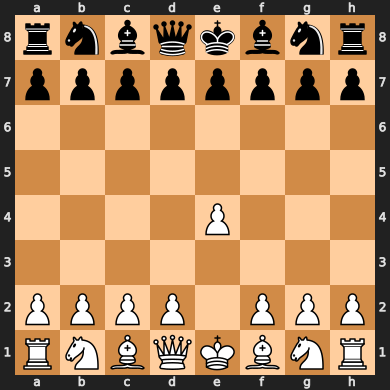

In [1]:
import chess
import chess.svg
from IPython.display import SVG

# Create a chess board
board = chess.Board()

# Set up a specific position (optional)
board.set_fen("rnbqkbnr/pppppppp/8/8/4P3/8/PPPP1PPP/RNBQKBNR b KQkq - 0 1")  # Example: after 1.e4

# Display the board
SVG(chess.svg.board(board=board))

First Three Moves: e4 e5 Nf3 | Draws: 186


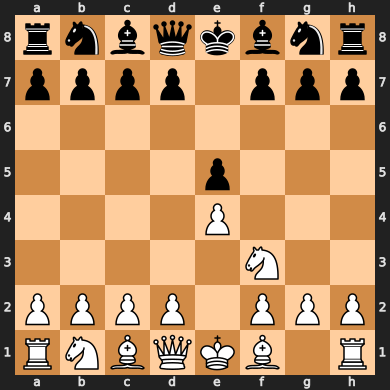

First Three Moves: e4 c5 Nf3 | Draws: 76


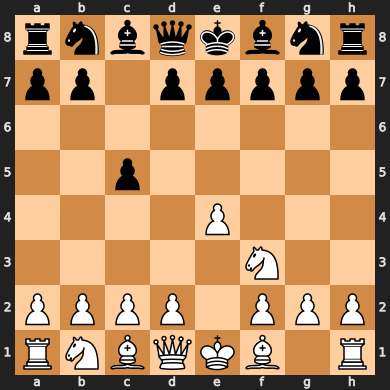

First Three Moves: d4 d5 c4 | Draws: 49


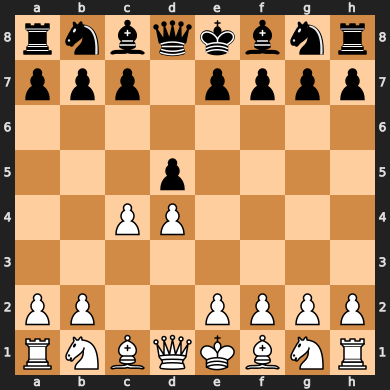

In [3]:
import pandas as pd
import chess
import chess.svg
from IPython.display import SVG, display

# Load the CSV file into a DataFrame
df = pd.read_csv('games.csv')

# Extract the first three moves from each game
df['first_three_moves'] = df['moves'].apply(lambda x: ' '.join(x.split()[:3]))

# Create columns indicating the winner
df['white_win'] = df['winner'].apply(lambda x: 1 if x == 'white' else 0)
df['black_win'] = df['winner'].apply(lambda x: 1 if x == 'black' else 0)
df['draw'] = df['winner'].apply(lambda x: 1 if x == 'draw' else 0)

# Group by the sequence of the first three moves
grouped = df.groupby('first_three_moves').agg(
    total_games=('winner', 'count'),
    white_wins=('white_win', 'sum'),
    black_wins=('black_win', 'sum'),
    draws=('draw', 'sum')
)

# Sort by the highest number of draws
top_draw_sequences = grouped.sort_values(by='draws', ascending=False).head(3).reset_index()

# Display images for the top three sequences with the highest number of draws
for index, row in top_draw_sequences.iterrows():
    moves = row['first_three_moves']
    print(f"First Three Moves: {moves} | Draws: {row['draws']}")

    # Create a new chess board and apply the moves
    board = chess.Board()
    for move in moves.split():
        board.push_san(move)
    
    # Display the chess board as SVG
    display(SVG(chess.svg.board(board=board)))


First Three Moves: e4 e5 Nf3 | Occurrences: 4234


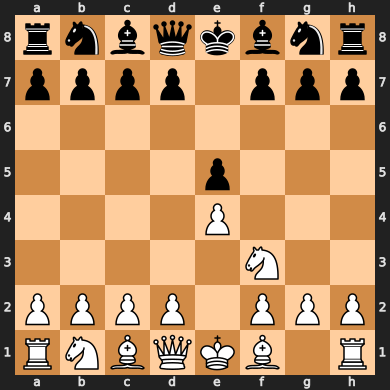

First Three Moves: e4 c5 Nf3 | Occurrences: 1461


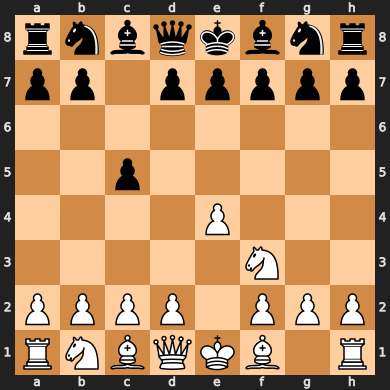

First Three Moves: d4 d5 c4 | Occurrences: 1044


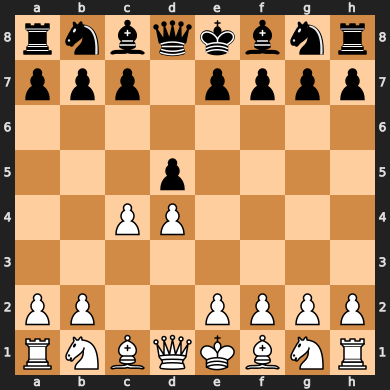

First Three Moves: e4 e6 d4 | Occurrences: 673


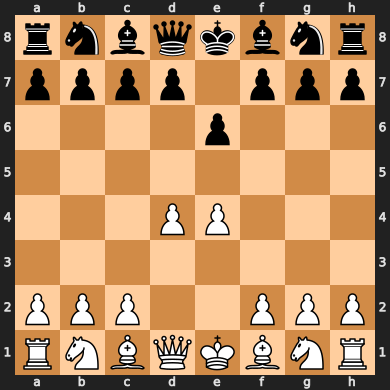

First Three Moves: d4 Nf6 c4 | Occurrences: 589


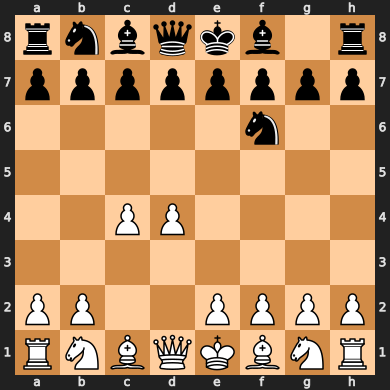

First Three Moves: e4 d5 exd5 | Occurrences: 509


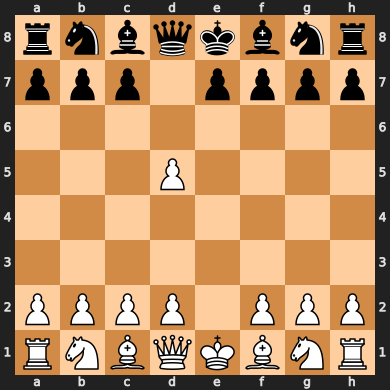

First Three Moves: e4 e5 Bc4 | Occurrences: 497


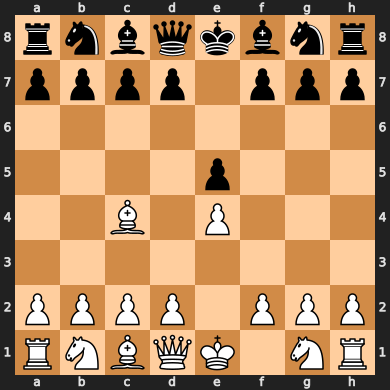

First Three Moves: e4 e6 Nf3 | Occurrences: 339


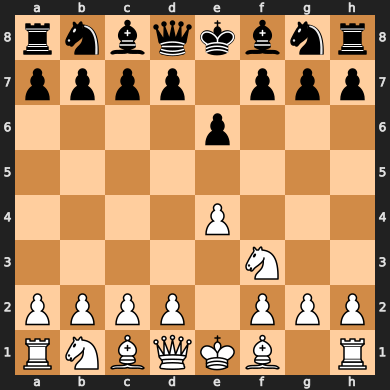

First Three Moves: d4 d5 Nf3 | Occurrences: 325


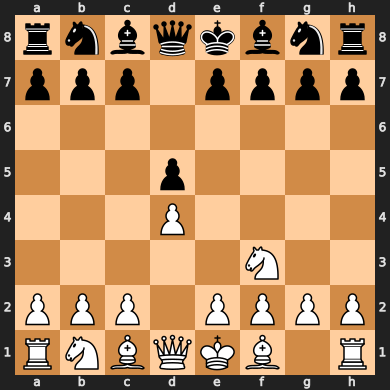

First Three Moves: e4 e5 d4 | Occurrences: 324


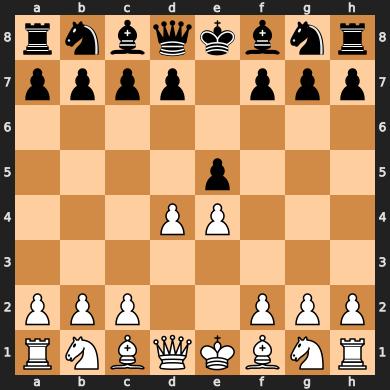

In [4]:
import pandas as pd
import chess
import chess.svg
from IPython.display import SVG, display

# Load the CSV file into a DataFrame
df = pd.read_csv('games.csv')

# Extract the first three moves from each game
df['first_three_moves'] = df['moves'].apply(lambda x: ' '.join(x.split()[:3]))

# Group by the sequence of the first three moves and count occurrences
grouped = df.groupby('first_three_moves').size().reset_index(name='count')

# Sort by the most common sequences and select the top 10
top_common_sequences = grouped.sort_values(by='count', ascending=False).head(10).reset_index(drop=True)

# Display images for the top ten most common sequences
for index, row in top_common_sequences.iterrows():
    moves = row['first_three_moves']
    print(f"First Three Moves: {moves} | Occurrences: {row['count']}")

    # Create a new chess board and apply the moves
    board = chess.Board()
    for move in moves.split():
        board.push_san(move)
    
    # Display the chess board as SVG
    display(SVG(chess.svg.board(board=board)))


In [2]:
import pandas as pd
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Load the CSV file into a DataFrame
df = pd.read_csv('games.csv')

# Prepare the moves as a list of lists for Word2Vec training
# Each game is represented as a list of moves (like sentences of words)
moves_list = df['moves'].apply(lambda x: x.split()).tolist()

# Train a Word2Vec model on the moves
model = Word2Vec(sentences=moves_list, vector_size=100, window=5, min_count=1, workers=4)


In [6]:
import pandas as pd
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import plotly.express as px

# Load the trained Word2Vec model (or train it if not saved yet)
# model = Word2Vec.load("chess_moves_word2vec.model") # Uncomment if model is saved
# Otherwise, train the model as shown earlier

# Extract the embeddings for all moves in the vocabulary
word_vectors = model.wv[model.wv.index_to_key]  # Embedding matrix of all moves
words = model.wv.index_to_key  # List of all moves (tokens)

# ----------------------------------------------
# Visualization 1: PCA
# ----------------------------------------------
pca = PCA(n_components=2, random_state=42)
pca_embeddings = pca.fit_transform(word_vectors)

# Create a DataFrame for Plotly
pca_df = pd.DataFrame(pca_embeddings, columns=['PCA1', 'PCA2'])
pca_df['Move'] = words

# Plot with Plotly
fig_pca = px.scatter(pca_df, x='PCA1', y='PCA2', hover_name='Move', title="PCA Visualization of Chess Move Embeddings")
fig_pca.update_traces(marker=dict(size=5))
fig_pca.show()

# ----------------------------------------------
# Visualization 2: UMAP
# ----------------------------------------------
umap_reducer = umap.UMAP(n_components=2, random_state=42)
umap_embeddings = umap_reducer.fit_transform(word_vectors)

# Create a DataFrame for Plotly
umap_df = pd.DataFrame(umap_embeddings, columns=['UMAP1', 'UMAP2'])
umap_df['Move'] = words

# Plot with Plotly
fig_umap = px.scatter(umap_df, x='UMAP1', y='UMAP2', hover_name='Move', title="UMAP Visualization of Chess Move Embeddings")
fig_umap.update_traces(marker=dict(size=5))
fig_umap.show()

# ----------------------------------------------
# Visualization 3: t-SNE
# ----------------------------------------------
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_embeddings = tsne.fit_transform(word_vectors)

# Create a DataFrame for Plotly
tsne_df = pd.DataFrame(tsne_embeddings, columns=['t-SNE1', 't-SNE2'])
tsne_df['Move'] = words

# Plot with Plotly
fig_tsne = px.scatter(tsne_df, x='t-SNE1', y='t-SNE2', hover_name='Move', title="t-SNE Visualization of Chess Move Embeddings")
fig_tsne.update_traces(marker=dict(size=5))
fig_tsne.show()

/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [7]:
import pandas as pd
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import plotly.express as px

# Load the trained Word2Vec model (or train it if not saved yet)
# model = Word2Vec.load("chess_moves_word2vec.model") # Uncomment if model is saved
# Otherwise, train the model as shown earlier

# Extract the embeddings for all moves in the vocabulary
word_vectors = model.wv[model.wv.index_to_key]  # Embedding matrix of all moves
words = model.wv.index_to_key  # List of all moves (tokens)

# ----------------------------------------------
# Step 1: UMAP to reduce dimensions from original to 20
# ----------------------------------------------
umap_reducer = umap.UMAP(n_components=20, random_state=42)
umap_embeddings = umap_reducer.fit_transform(word_vectors)

# ----------------------------------------------
# Step 2: PCA to reduce dimensions from 20 to 5
# ----------------------------------------------
pca = PCA(n_components=5, random_state=42)
pca_embeddings = pca.fit_transform(umap_embeddings)

# ----------------------------------------------
# Step 3: t-SNE to reduce dimensions from 5 to 2 for final visualization
# ----------------------------------------------
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_embeddings = tsne.fit_transform(pca_embeddings)

# Create a DataFrame for Plotly
combined_df = pd.DataFrame(tsne_embeddings, columns=['Combined-tSNE1', 'Combined-tSNE2'])
combined_df['Move'] = words

# Plot with Plotly
fig_combined = px.scatter(combined_df, x='Combined-tSNE1', y='Combined-tSNE2', hover_name='Move', 
                          title="Combined UMAP, PCA, and t-SNE Visualization of Chess Move Embeddings")
fig_combined.update_traces(marker=dict(size=5))
fig_combined.show()


/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [10]:
import pandas as pd
from gensim.models import Word2Vec
import re

# Load the CSV file into a DataFrame
df = pd.read_csv('games.csv')

# Preprocess the moves to keep only the destination square
def strip_to_square(move):
    # Remove piece notation (first letter if it's uppercase) and any capture marker 'x'
    return re.sub(r'^[NBRQK]?x?', '', move)

# Apply preprocessing to each move in each game
df['square_moves'] = df['moves'].apply(lambda game: [strip_to_square(move) for move in game.split()])

# Prepare the data as a list of lists for Word2Vec training
# Each game is represented as a list of destination squares
squares_list = df['square_moves'].tolist()

# Train a Word2Vec model on the square moves
square_model = Word2Vec(sentences=squares_list, vector_size=100, window=5, min_count=1, workers=4)

# Save the trained model if needed
square_model.save("chess_square_word2vec.model")

# Display some example embeddings for squares
example_squares = ["e4", "d5", "f7"]
for square in example_squares:
    print(f"Embedding for {square}: {square_model.wv[square]}")


Embedding for e4: [-2.9673785e-01  6.8155944e-01  5.0460148e-01  7.5788122e-01
  8.2902306e-01 -3.4474316e-01  4.4812396e-01  6.3575104e-02
  1.6687267e-01  4.2179995e-03  3.5816166e-01  2.5252825e-01
  8.8107690e-02 -5.4457885e-01  6.5974849e-01  1.6404642e-01
  7.0932281e-01  3.3819383e-01 -4.7699311e-01  1.1253650e-01
 -5.9073746e-01  3.7027532e-01  9.5883501e-01  2.4720032e-02
 -2.9881588e-01  6.3360107e-01 -1.7296515e-01  1.9845090e+00
 -4.0047282e-01  5.2900726e-01  1.3245538e+00 -1.1346350e+00
 -1.9460993e-01 -1.0962085e+00 -1.7082785e-01  9.4525778e-01
  1.6046188e+00  6.6273600e-02 -1.1139457e+00  5.2130109e-01
 -4.8365381e-01  1.2536627e+00 -9.2600816e-01  4.4294454e-02
  1.3804357e-01 -7.7030674e-02  8.2389373e-01 -1.0151893e+00
 -3.5990116e-01 -6.5868634e-01 -3.5088113e-01 -2.6060598e-02
 -3.8548276e-01  5.2973616e-01 -8.9930326e-01 -1.2298487e-01
  1.5649635e-03  5.6132283e-02  8.8236725e-01 -2.2418031e-02
 -1.0014125e+00 -6.7064989e-01  5.2954113e-01  4.4655260e-01
 -2.01

In [11]:
import pandas as pd
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import plotly.express as px

# Load the trained Word2Vec model for squares (or train it if not saved yet)
# square_model = Word2Vec.load("chess_square_word2vec.model") # Uncomment if model is saved
# Otherwise, train the model as shown in the previous example

# Extract the embeddings for all squares in the vocabulary
square_vectors = square_model.wv[square_model.wv.index_to_key]  # Embedding matrix of all squares
squares = square_model.wv.index_to_key  # List of all squares (tokens)

# ----------------------------------------------
# Visualization 1: PCA
# ----------------------------------------------
pca = PCA(n_components=2, random_state=42)
pca_embeddings = pca.fit_transform(square_vectors)

# Create a DataFrame for Plotly
pca_df = pd.DataFrame(pca_embeddings, columns=['PCA1', 'PCA2'])
pca_df['Square'] = squares

# Plot with Plotly
fig_pca = px.scatter(pca_df, x='PCA1', y='PCA2', hover_name='Square', title="PCA Visualization of Chess Square Embeddings")
fig_pca.update_traces(marker=dict(size=5))
fig_pca.show()

# ----------------------------------------------
# Visualization 2: UMAP
# ----------------------------------------------
umap_reducer = umap.UMAP(n_components=2, random_state=42)
umap_embeddings = umap_reducer.fit_transform(square_vectors)

# Create a DataFrame for Plotly
umap_df = pd.DataFrame(umap_embeddings, columns=['UMAP1', 'UMAP2'])
umap_df['Square'] = squares

# Plot with Plotly
fig_umap = px.scatter(umap_df, x='UMAP1', y='UMAP2', hover_name='Square', title="UMAP Visualization of Chess Square Embeddings")
fig_umap.update_traces(marker=dict(size=5))
fig_umap.show()

# ----------------------------------------------
# Visualization 3: t-SNE
# ----------------------------------------------
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_embeddings = tsne.fit_transform(square_vectors)

# Create a DataFrame for Plotly
tsne_df = pd.DataFrame(tsne_embeddings, columns=['t-SNE1', 't-SNE2'])
tsne_df['Square'] = squares

# Plot with Plotly
fig_tsne = px.scatter(tsne_df, x='t-SNE1', y='t-SNE2', hover_name='Square', title="t-SNE Visualization of Chess Square Embeddings")
fig_tsne.update_traces(marker=dict(size=5))
fig_tsne.show()


/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [12]:
import pandas as pd
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import plotly.express as px

# Load the trained Word2Vec model for squares (or train it if not saved yet)
# square_model = Word2Vec.load("chess_square_word2vec.model") # Uncomment if model is saved
# Otherwise, train the model as shown in the previous example

# Extract the embeddings for all squares in the vocabulary
square_vectors = square_model.wv[square_model.wv.index_to_key]  # Embedding matrix of all squares
squares = square_model.wv.index_to_key  # List of all squares (tokens)

# ----------------------------------------------
# Step 1: UMAP to reduce dimensions from original to 20
# ----------------------------------------------
umap_reducer = umap.UMAP(n_components=20, random_state=42)
umap_embeddings = umap_reducer.fit_transform(square_vectors)

# ----------------------------------------------
# Step 2: PCA to reduce dimensions from 20 to 5
# ----------------------------------------------
pca = PCA(n_components=5, random_state=42)
pca_embeddings = pca.fit_transform(umap_embeddings)

# ----------------------------------------------
# Step 3: t-SNE to reduce dimensions from 5 to 2 for final visualization
# ----------------------------------------------
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_embeddings = tsne.fit_transform(pca_embeddings)

# Create a DataFrame for Plotly
combined_df = pd.DataFrame(tsne_embeddings, columns=['Combined-tSNE1', 'Combined-tSNE2'])
combined_df['Square'] = squares

# Plot with Plotly
fig_combined = px.scatter(combined_df, x='Combined-tSNE1', y='Combined-tSNE2', hover_name='Square', 
                          title="Combined UMAP, PCA, and t-SNE Visualization of Chess Square Embeddings")
fig_combined.update_traces(marker=dict(size=5))
fig_combined.show()


/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [13]:
import pandas as pd
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
import umap
import plotly.express as px

# Load the trained Word2Vec model for squares (or train it if not saved yet)
# square_model = Word2Vec.load("chess_square_word2vec.model") # Uncomment if model is saved
# Otherwise, train the model as shown in the previous example

# Extract the embeddings for all squares in the vocabulary
square_vectors = square_model.wv[square_model.wv.index_to_key]  # Embedding matrix of all squares
squares = square_model.wv.index_to_key  # List of all squares (tokens)

# ----------------------------------------------
# Step 1: UMAP to reduce dimensions from original to 20
# ----------------------------------------------
umap_reducer = umap.UMAP(n_components=20, random_state=42)
umap_embeddings = umap_reducer.fit_transform(square_vectors)

# ----------------------------------------------
# Step 2: t-SNE to reduce dimensions from 20 to 2 for final visualization
# ----------------------------------------------
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_embeddings = tsne.fit_transform(umap_embeddings)

# Create a DataFrame for Plotly
combined_df = pd.DataFrame(tsne_embeddings, columns=['Combined-tSNE1', 'Combined-tSNE2'])
combined_df['Square'] = squares

# Plot with Plotly
fig_combined = px.scatter(combined_df, x='Combined-tSNE1', y='Combined-tSNE2', hover_name='Square', 
                          title="Combined UMAP and t-SNE Visualization of Chess Square Embeddings (No PCA)")
fig_combined.update_traces(marker=dict(size=5))
fig_combined.show()


/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [15]:
import pandas as pd
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
import umap
import plotly.express as px

# Load the trained Word2Vec model for squares (or train it if not saved yet)
# square_model = Word2Vec.load("chess_square_word2vec.model") # Uncomment if model is saved
# Otherwise, train the model as shown in the previous example

# Extract the embeddings for all squares in the vocabulary
square_vectors = square_model.wv[square_model.wv.index_to_key]  # Embedding matrix of all squares
squares = square_model.wv.index_to_key  # List of all squares (tokens)

# ----------------------------------------------
# Step 1: UMAP to reduce dimensions to 1D
# ----------------------------------------------
umap_reducer = umap.UMAP(n_components=1, random_state=42)
umap_1d = umap_reducer.fit_transform(square_vectors)

# Step 2: t-SNE to reduce dimensions to 1D
# ----------------------------------------------
tsne = TSNE(n_components=1, random_state=42, perplexity=30)
tsne_1d = tsne.fit_transform(square_vectors)

# Create a DataFrame with both 1D UMAP and 1D t-SNE results
combined_df = pd.DataFrame({
    'UMAP': umap_1d.flatten(),
    't-SNE': tsne_1d.flatten(),
    'Square': squares
})

# Plot with Plotly
fig = px.scatter(combined_df, x='UMAP', y='t-SNE', hover_name='Square', 
                 title="1D UMAP vs. 1D t-SNE Visualization of Chess Square Embeddings")
fig.update_traces(marker=dict(size=5))
fig.show()


/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [17]:
import pandas as pd
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
import umap
import plotly.express as px

# Load the trained Word2Vec model for squares (or train it if not saved yet)
# square_model = Word2Vec.load("chess_square_word2vec.model") # Uncomment if model is saved
# Otherwise, train the model as shown in the previous example

# Extract the embeddings for all squares in the vocabulary
square_vectors = square_model.wv[square_model.wv.index_to_key]  # Embedding matrix of all squares
squares = square_model.wv.index_to_key  # List of all squares (tokens)

# Container to store each step's results for animation
frames = []

# Start by using only UMAP to reduce directly to 2D
umap_reducer = umap.UMAP(n_components=2, random_state=42)
umap_2d = umap_reducer.fit_transform(square_vectors)
df_umap_2d = pd.DataFrame(umap_2d, columns=['Dim1', 'Dim2'])
df_umap_2d['Square'] = squares
df_umap_2d['Step'] = 1  # Initial step
frames.append(df_umap_2d)

# Progressive shift from UMAP to PCA
for dims in range(20, 1, -1):
    # Step 1: UMAP to reduce dimensions to the intermediate dimension
    umap_reducer = umap.UMAP(n_components=dims, random_state=42)
    umap_intermediate = umap_reducer.fit_transform(square_vectors)
    
    # Step 2: PCA to further reduce the intermediate UMAP output to 2D
    pca = PCA(n_components=2, random_state=42)
    pca_2d = pca.fit_transform(umap_intermediate)
    
    # Store the PCA 2D coordinates in a DataFrame for this step
    df_step = pd.DataFrame(pca_2d, columns=['Dim1', 'Dim2'])
    df_step['Square'] = squares
    df_step['Step'] = 21 - dims  # Track step number for animation (1 to 20)
    
    # Append to frames list
    frames.append(df_step)

# Final Step: Use only PCA to reduce directly to 2D
pca_final = PCA(n_components=2, random_state=42)
pca_2d_final = pca_final.fit_transform(square_vectors)
df_pca_2d = pd.DataFrame(pca_2d_final, columns=['Dim1', 'Dim2'])
df_pca_2d['Square'] = squares
df_pca_2d['Step'] = 21  # Final step
frames.append(df_pca_2d)

# Combine all frames into a single DataFrame
combined_df = pd.concat(frames, ignore_index=True)

# Plotly animation
fig = px.scatter(combined_df, x='Dim1', y='Dim2', hover_name='Square', animation_frame='Step',
                 title="Progressive Transition from UMAP to PCA Visualization of Chess Square Embeddings")
fig.update_traces(marker=dict(size=5))
fig.update_layout(transition={'duration': 500})
fig.show()


/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/User

In [18]:
import pandas as pd
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
import umap
import plotly.express as px

# Load the trained Word2Vec model for squares (or train it if not saved yet)
# square_model = Word2Vec.load("chess_square_word2vec.model") # Uncomment if model is saved
# Otherwise, train the model as shown in the previous example

# Extract the embeddings for all squares in the vocabulary
square_vectors = square_model.wv[square_model.wv.index_to_key]  # Embedding matrix of all squares
squares = square_model.wv.index_to_key  # List of all squares (tokens)

# Container to store each step's results for animation
frames = []

# Determine the initial and final UMAP dimensionalities for a gradual transition
initial_dim = 50  # Start with UMAP reducing to 50 dimensions
final_dim = 2     # End with PCA only in 2D

# Linearly decrease UMAP dimensionality across 50 steps
for step in range(50, 0, -1):
    current_dim = int(initial_dim * (step / 50))  # Gradually decrease from 50D to 1D

    if current_dim > 2:
        # Step 1: UMAP to reduce dimensions to the current intermediate dimension
        umap_reducer = umap.UMAP(n_components=current_dim, random_state=42)
        umap_intermediate = umap_reducer.fit_transform(square_vectors)
        
        # Step 2: PCA to further reduce the intermediate UMAP output to 2D
        pca = PCA(n_components=2, random_state=42)
        pca_2d = pca.fit_transform(umap_intermediate)
        
    else:
        # For the final step, use only PCA directly to 2D
        pca = PCA(n_components=2, random_state=42)
        pca_2d = pca.fit_transform(square_vectors)
    
    # Store the 2D coordinates in a DataFrame for this step
    df_step = pd.DataFrame(pca_2d, columns=['Dim1', 'Dim2'])
    df_step['Square'] = squares
    df_step['Step'] = 51 - step  # Track step number for animation (1 to 50)
    
    # Append to frames list
    frames.append(df_step)

# Combine all frames into a single DataFrame
combined_df = pd.concat(frames, ignore_index=True)

# Plotly animation
fig = px.scatter(combined_df, x='Dim1', y='Dim2', hover_name='Square', animation_frame='Step',
                 title="Progressive Transition from UMAP to PCA Visualization of Chess Square Embeddings")
fig.update_traces(marker=dict(size=5))
fig.update_layout(transition={'duration': 300})
fig.show()


/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/User

In [20]:
import pandas as pd

# Sample DataFrame (assuming df is already loaded with a 'moves' column)
# df = pd.read_csv('your_games.csv')  # Uncomment if loading from a CSV file

# Write each row of the 'moves' column as a new line in a text file
with open("chess_games.txt", "w") as f:
    for moves in df['moves']:
        f.write(moves + "\n")


In [1]:
from transformers import GPT2LMHeadModel, GPT2Tokenizer, Trainer, TrainingArguments
from datasets import Dataset
import pandas as pd

# Load the text file manually using pandas
data = pd.read_csv("chess_games.txt", header=None, names=["text"])

# Convert to Hugging Face Dataset format
dataset = Dataset.from_pandas(data)

# Split the dataset into train and validation sets
dataset = dataset.train_test_split(test_size=0.1)

# Load the GPT-2 tokenizer and model
model_name = "gpt2"  # You can use "gpt2-medium", "gpt2-large", or "gpt2-xl" for larger models
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

# Set the padding token to the EOS token
tokenizer.pad_token = tokenizer.eos_token

# Tokenize the dataset
def tokenize_function(examples):
    return tokenizer(examples["text"], padding="max_length", truncation=True, max_length=128)

# Apply tokenization to the dataset
tokenized_datasets = dataset.map(tokenize_function, batched=True, remove_columns=["text"])

# Define training arguments
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=2e-5,
    weight_decay=0.01,
    per_device_train_batch_size=2,
    per_device_eval_batch_size=2,
    num_train_epochs=3,
    save_steps=500,
    logging_dir='./logs',             # Directory for storing logs
    logging_steps=10,
)

# Initialize the Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets["train"],
    eval_dataset=tokenized_datasets["test"],
)

# Train the model
trainer.train()

# Save the fine-tuned model
trainer.save_model("fine_tuned_gpt2_chess")
tokenizer.save_pretrained("fine_tuned_gpt2_chess")



Map:   0%|          | 0/18052 [00:00<?, ? examples/s]

Map:   0%|          | 0/2006 [00:00<?, ? examples/s]

/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/transformers/training_args.py:1545: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


  0%|          | 0/27078 [00:00<?, ?it/s]

ValueError: The model did not return a loss from the inputs, only the following keys: logits,past_key_values. For reference, the inputs it received are input_ids,attention_mask.

In [2]:
def tokenize_function(examples):
    # Tokenize the text and set labels
    tokens = tokenizer(examples["text"], padding="max_length", truncation=True, max_length=128)
    tokens["labels"] = tokens["input_ids"].copy()
    return tokens


In [3]:
from transformers import GPT2LMHeadModel, GPT2Tokenizer, Trainer, TrainingArguments
from datasets import Dataset
import pandas as pd

# Load the text file manually using pandas
data = pd.read_csv("chess_games.txt", header=None, names=["text"])

# Convert to Hugging Face Dataset format
dataset = Dataset.from_pandas(data)

# Split the dataset into train and validation sets
dataset = dataset.train_test_split(test_size=0.1)

# Load the GPT-2 tokenizer and model
model_name = "gpt2"  # You can use "gpt2-medium", "gpt2-large", or "gpt2-xl" for larger models
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

# Set the padding token to the EOS token
tokenizer.pad_token = tokenizer.eos_token

# Tokenize the dataset and set labels
def tokenize_function(examples):
    tokens = tokenizer(examples["text"], padding="max_length", truncation=True, max_length=128)
    tokens["labels"] = tokens["input_ids"].copy()
    return tokens

# Apply tokenization to the dataset
tokenized_datasets = dataset.map(tokenize_function, batched=True, remove_columns=["text"])

# Define training arguments
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=2e-5,
    weight_decay=0.01,
    per_device_train_batch_size=2,
    per_device_eval_batch_size=2,
    num_train_epochs=3,
    save_steps=500,
    logging_dir='./logs',             # Directory for storing logs
    logging_steps=10,
)

# Initialize the Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets["train"],
    eval_dataset=tokenized_datasets["test"],
)

# Train the model
trainer.train()

# Save the fine-tuned model
trainer.save_model("fine_tuned_gpt2_chess")
tokenizer.save_pretrained("fine_tuned_gpt2_chess")


Map:   0%|          | 0/18052 [00:00<?, ? examples/s]

Map:   0%|          | 0/2006 [00:00<?, ? examples/s]

/Users/robertbecker/miniconda3/envs/my_project_env/lib/python3.8/site-packages/transformers/training_args.py:1545: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


  0%|          | 0/27078 [00:00<?, ?it/s]

{'loss': 3.0572, 'grad_norm': 17.162797927856445, 'learning_rate': 1.999261393012778e-05, 'epoch': 0.0}
{'loss': 2.1817, 'grad_norm': 11.871376037597656, 'learning_rate': 1.9985227860255562e-05, 'epoch': 0.0}
{'loss': 1.9896, 'grad_norm': 33.14591598510742, 'learning_rate': 1.997784179038334e-05, 'epoch': 0.0}
{'loss': 1.9634, 'grad_norm': 15.278849601745605, 'learning_rate': 1.9970455720511116e-05, 'epoch': 0.0}
{'loss': 1.9007, 'grad_norm': 11.7137451171875, 'learning_rate': 1.99630696506389e-05, 'epoch': 0.01}
{'loss': 1.7803, 'grad_norm': 18.68660545349121, 'learning_rate': 1.9955683580766676e-05, 'epoch': 0.01}
{'loss': 1.8064, 'grad_norm': 14.868969917297363, 'learning_rate': 1.9948297510894453e-05, 'epoch': 0.01}
{'loss': 1.8067, 'grad_norm': 10.576797485351562, 'learning_rate': 1.9940911441022233e-05, 'epoch': 0.01}
{'loss': 1.9103, 'grad_norm': 13.570046424865723, 'learning_rate': 1.9933525371150013e-05, 'epoch': 0.01}
{'loss': 1.7613, 'grad_norm': 17.156517028808594, 'learnin

  0%|          | 0/1003 [00:00<?, ?it/s]

{'eval_loss': 1.2432093620300293, 'eval_runtime': 63.264, 'eval_samples_per_second': 31.708, 'eval_steps_per_second': 15.854, 'epoch': 1.0}
{'loss': 1.4253, 'grad_norm': 9.124815940856934, 'learning_rate': 1.3330378905384447e-05, 'epoch': 1.0}
{'loss': 1.4157, 'grad_norm': 8.533950805664062, 'learning_rate': 1.3322992835512226e-05, 'epoch': 1.0}
{'loss': 1.4463, 'grad_norm': 9.287493705749512, 'learning_rate': 1.3315606765640003e-05, 'epoch': 1.0}
{'loss': 1.2157, 'grad_norm': 10.226863861083984, 'learning_rate': 1.3308220695767785e-05, 'epoch': 1.0}
{'loss': 1.3114, 'grad_norm': 6.853759765625, 'learning_rate': 1.3300834625895561e-05, 'epoch': 1.0}
{'loss': 1.3491, 'grad_norm': 8.456363677978516, 'learning_rate': 1.329344855602334e-05, 'epoch': 1.01}
{'loss': 1.309, 'grad_norm': 9.427604675292969, 'learning_rate': 1.3286062486151122e-05, 'epoch': 1.01}
{'loss': 1.2287, 'grad_norm': 9.656621932983398, 'learning_rate': 1.3278676416278899e-05, 'epoch': 1.01}
{'loss': 1.3237, 'grad_norm':

  0%|          | 0/1003 [00:00<?, ?it/s]

{'eval_loss': 1.169363260269165, 'eval_runtime': 35.9569, 'eval_samples_per_second': 55.789, 'eval_steps_per_second': 27.894, 'epoch': 2.0}
{'loss': 1.2293, 'grad_norm': 6.963841438293457, 'learning_rate': 6.660757810768891e-06, 'epoch': 2.0}
{'loss': 1.158, 'grad_norm': 6.375697612762451, 'learning_rate': 6.653371740896669e-06, 'epoch': 2.0}
{'loss': 1.2628, 'grad_norm': 7.269372940063477, 'learning_rate': 6.6459856710244485e-06, 'epoch': 2.0}
{'loss': 1.3574, 'grad_norm': 7.811058044433594, 'learning_rate': 6.638599601152227e-06, 'epoch': 2.0}
{'loss': 1.2697, 'grad_norm': 7.776434421539307, 'learning_rate': 6.6312135312800064e-06, 'epoch': 2.01}
{'loss': 1.2896, 'grad_norm': 7.2428460121154785, 'learning_rate': 6.623827461407786e-06, 'epoch': 2.01}
{'loss': 1.1291, 'grad_norm': 8.025839805603027, 'learning_rate': 6.616441391535564e-06, 'epoch': 2.01}
{'loss': 1.2216, 'grad_norm': 5.966474533081055, 'learning_rate': 6.609055321663344e-06, 'epoch': 2.01}
{'loss': 1.2022, 'grad_norm': 

  0%|          | 0/1003 [00:00<?, ?it/s]

{'eval_loss': 1.147705316543579, 'eval_runtime': 36.1547, 'eval_samples_per_second': 55.484, 'eval_steps_per_second': 27.742, 'epoch': 3.0}
{'train_runtime': 6425.2037, 'train_samples_per_second': 8.429, 'train_steps_per_second': 4.214, 'train_loss': 1.2915757402058974, 'epoch': 3.0}


('fine_tuned_gpt2_chess/tokenizer_config.json',
 'fine_tuned_gpt2_chess/special_tokens_map.json',
 'fine_tuned_gpt2_chess/vocab.json',
 'fine_tuned_gpt2_chess/merges.txt',
 'fine_tuned_gpt2_chess/added_tokens.json')